# 6.UAP: ReChordr 2
## Sarah Shader 

Click on a cell and press _Control Enter_ to run the python code in that cell.

The two code cells below should run without error if you installed all the necessary components.

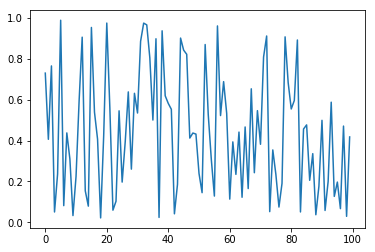

In [1]:
import numpy as np
import scipy
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline
import IPython.display as ipd
from mido import MidiFile
import re
import os.path
import math

import sys
sys.path.append('..')
from common.gaussian_kernel import *
from rhythm_quantizer import *
    
plt.figure()
plt.plot(np.random.random(100))
ipd.Audio(url="http://www.w3schools.com/html/horse.ogg")

In [2]:
@interact(a=(1,10))
def foo(a):
    print a ** 2


interactive(children=(IntSlider(value=5, description=u'a', max=10, min=1), Output()), _dom_classes=('widget-interact',))

Note: you should see a slider generated for the above code cell that lets you change the values of `a`. If you don't see that, try running this on the command line:

`jupyter nbextension enable --py widgetsnbextension`

This is to process midi files into onsets.

In [3]:
def get_onsets_from_midi(filename):
    # absolute time for each midi event
    counter = 0

    noteon_matcher = re.compile('^note_on')
    onset_times = []
    mid = MidiFile(filename)
    for msg in mid.play():
        counter += msg.time
        if noteon_matcher.match(str(msg)):
            onset_times.append(counter)
    return onset_times

In [4]:
def write_to_file(filename, lines):
    fh = open(filename, 'w')
    s = '\n'
    s = s.join([str(l) for l in lines])
    fh.write(s)
    fh.close()

In [5]:
def read_onsets_from_file(filename):
    if not os.path.exists(filename):
        return []
    fh = open(filename, 'r')
    arr = fh.readlines()
    return [float(a.strip()) for a in arr]

Once we have onsets, functions to process them and play them back.

In [6]:
def collapse_onsets(onsets, threshold):
    collapsed_onsets = []
    cur_onset = onsets[0]
    for i in onsets:
        if i - cur_onset > threshold:
            collapsed_onsets.append(cur_onset)
            cur_onset = i
    return collapsed_onsets

In [7]:
def get_onset_clicks(onsets, sample_rate=22000):
    audio_arr = [0]*(int(onsets[-1] + 1) * int(sample_rate))
    for i in onsets:
        start = int(i * sample_rate)
        for j in range(10):
            audio_arr[start + j] = 1
    return audio_arr

In [8]:
def get_iois(onsets):
    iois = []
    for i in range(len(onsets) - 1):
        iois.append(onsets[i + 1] - onsets[i])
    return iois

In [9]:
onset_times = read_onsets_from_file('rh_onsets.txt')
if len(onset_times) == 0:
    onset_times = get_onsets_from_midi('rh.mid')
    write_to_file('rh_onsets.txt', onset_times)
threshold = .1
collapsed_onsets = collapse_onsets(onset_times, threshold)
clicks = get_onset_clicks(collapsed_onsets)
ipd.Audio(clicks, rate = 22000)     

In [10]:
bach_test_onset_times = read_onsets_from_file('bach_test_onsets.txt')
if len(bach_test_onset_times) == 0:
    bach_test_onset_times = get_onsets_from_midi('bach_test.mid')
    write_to_file('bach_test_onsets.txt', bach_test_onset_times)
threshold = .1
collapsed_onsets = collapse_onsets(onset_times, threshold)
clicks = get_onset_clicks(collapsed_onsets)
ipd.Audio(clicks, rate = 22000)

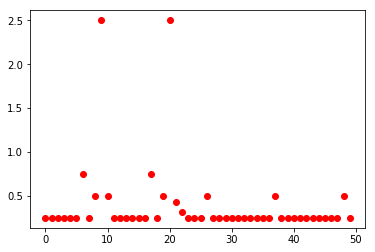

In [14]:
iois = get_iois(collapsed_onsets)
plt.plot(iois[0:50], 'ro')

Parameters needed for algorithm:

all possible measure positions, array/set of measure positions as floats in range 0 to 1

initial prob distro, as a function taking in a float corresponding to a measure position

transition prob distro, as a function taking in two floats corresponding to measure positions

tempo mean, float, seconds per measure

tempo var, float

tempo change, float

tempo noise, float

In [16]:
iois = get_iois(collapsed_onsets)
positions = [0, .125, .25, .375, .5, .625, .75, .875]
def initial(p):
    return .125
def transition(p1, p2):
    return .125
r = RhythmQuantizer(
        positions,
        initial, 
        transition, 
        1.6, # tempo_mean, 
        .2, # tempo_variance, 
        .1, # tempo_change_variance, 
        .1, # tempo_noise_variance,
        0, # tempo_min,
        2.4) # tempo_max))
res = r.quantize(iois[0:100])
print res



(0.75, (460937652.90923923, 2.000328056352599, 8.981269804309221))
{(460937652.90923923, 2.000328056352599, 8.981269804309221): (0.625, (289615691.0551474, 2.000374302786069, 8.867071684679814))}
(0.625, (289615691.0551474, 2.000374302786069, 8.867071684679814))
{(289615691.0551474, 2.000374302786069, 8.867071684679814): (0.5, (181970923.69426098, 2.000427943835939, 8.722396069931051))}
(0.5, (181970923.69426098, 2.000427943835939, 8.722396069931051))
{(181970923.69426098, 2.000427943835939, 8.722396069931051): (0.375, (114335718.41139871, 2.0004905836375695, 8.53977472754407))}
(0.375, (114335718.41139871, 2.0004905836375695, 8.53977472754407))
{(114335718.41139871, 2.0004905836375695, 8.53977472754407): (0.25, (71839263.03230654, 2.000564375045192, 8.310311006560124))}
(0.25, (71839263.03230654, 2.000564375045192, 8.310311006560124))
{(71839263.03230654, 2.000564375045192, 8.310311006560124): (0.875, (135413937.9009515, 2.000818672424189, 8.322564816876278))}
(0.875, (135413937.90095

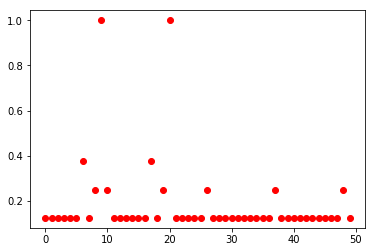

In [20]:
def get_lengths(res):
    lengths = []
    for i in range(len(res) - 1):
        lengths.append(r._get_note_length(res[i], res[i + 1]))
    return lengths

o = get_lengths(res)
plt.plot(o[0:50], 'ro')
# ipd.Audio(c, rate = 22000)